<a href="https://colab.research.google.com/github/pdiggidy/DataChallenge2/blob/main/Auto_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# imports

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import mean_squared_error, r2_score
from dateutil.relativedelta import relativedelta
import datetime
import warnings

# Ignore specific warning categories
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# preprocess data

## covid vs normal year

<ipython-input-12-fca18005567c>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  normal_df["y"] = date_counts["year"]
<ipython-input-12-fca18005567c>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_df["y"] = date_counts["year"]


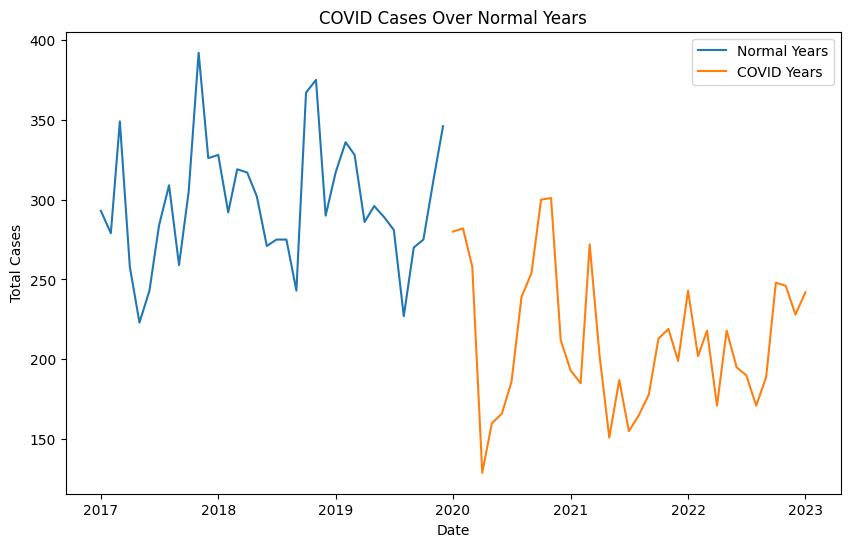

In [ ]:
df = pd.read_csv(r"https://raw.githubusercontent.com/forcept007/burglary-date/main/burglary.csv")
df['Month'] = pd.to_datetime(df['Month'], format='%Y-%m')
df['Month_num'] = df['Month'].dt.month.astype(int)
df['year_num'] = df['Month'].dt.year.astype(int)
# Rename the columns
df = df.rename(columns={'Month_num': 'm', 'year_num': 'year'})

# create 'ds' and convert it to datetime format
df['ds'] = pd.to_datetime(df['m'].astype(str) + '-' + df['year'].astype(str), format='%m-%Y')

# Define the start and end dates of the normal years
normal_start_date = pd.to_datetime('2017-01-01')
normal_end_date = pd.to_datetime('2019-12-31')

# Subset the DataFrame for the normal years
normal_df = df[(df['ds'] >= normal_start_date) & (df['ds'] <= normal_end_date)]

# create y
date_counts = normal_df.groupby('ds').transform('count')
normal_df["y"] = date_counts["year"]

# Subset the DataFrame for the COVID time period
covid_start_date = pd.to_datetime('2020-01-01')
covid_end_date = pd.to_datetime('2023-01-01')
covid_df = df[(df['ds'] >= covid_start_date) & (df['ds'] <= covid_end_date)]

# create y
date_counts = covid_df.groupby('ds').transform('count')
covid_df["y"] = date_counts["year"]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(normal_df['ds'], normal_df['y'], label='Normal Years')
plt.plot(covid_df['ds'], covid_df['y'], label='COVID Years')
plt.xlabel('Date')
plt.ylabel('Total Cases')
plt.title('COVID Cases Over Normal Years')
plt.legend()
plt.show()

## process data on LSOA code and date

## covid data imputed 2020-2021 inclusive

In [ ]:
# Load the data
df = pd.read_csv(r"https://raw.githubusercontent.com/forcept007/burglary-date/main/burglary.csv")
df['Month'] = pd.to_datetime(df['Month'], format='%Y-%m')
df['Month_num'] = df['Month'].dt.month.astype(int)
df['year_num'] = df['Month'].dt.year.astype(int)

# Rename the columns
df = df.rename(columns={'Month_num': 'm', 'year_num': 'year'})

# create 'ds' and convert it to datetime format
df['ds'] = pd.to_datetime(df['m'].astype(str) + '-' + df['year'].astype(str), format='%m-%Y')
df = df[(df['ds'] < '2020-01-01') | (df['ds'] >= '2022-01-01')]



df = df.groupby(['ds', 'LSOA code']).size().reset_index(name='y')

# Create a new dataframe to store the interpolated data
interpolated_df = pd.DataFrame(columns=df.columns)
# Define the start and end dates for the gap
start_date = pd.to_datetime('2020-01-01')
end_date = pd.to_datetime('2022-01-01')

# Iterate over each LSOA code
for lsoa_code in df['LSOA code'].unique():
    # Select the subset of data for the current LSOA code
    lsoa_subset = df[df['LSOA code'] == lsoa_code]

    # Create a new DataFrame that includes all months from 2020-01-01 to 2023-03-01
    new_df2 = pd.DataFrame({'ds': pd.date_range(start='2020-01-01', end='2021-12-01', freq='MS')})

    # Compute the  average for each month using data from previous years
    new_df2['y'] = np.nan
    new_df2['LSOA code'] = np.nan
    for idx, row in new_df2.iterrows():
        month = row['ds'].month
        avg = lsoa_subset[lsoa_subset['ds'].dt.month == month]['y'].mean() #* (1 - row['weights'])
        avg = int(avg)
        new_df2.loc[idx, 'y'] = avg
        new_df2.loc[idx, 'LSOA code'] = lsoa_code

    new_df2['y'] = new_df2['y'].astype(int)


    # Concatenate the new DataFrame with the original DataFrame
    imputed_df = pd.concat([lsoa_subset, new_df2[['ds', 'y', 'LSOA code']]], axis=0)
    imputed_df = imputed_df.reset_index(drop=True) #reset index
    imputed_df.sort_values(by=['ds'], inplace=True) #sort by date

    interpolated_df = interpolated_df.append(imputed_df)


interpolated_df.sort_values(by=['ds'], inplace=True) #sort by date
interpolated_df = interpolated_df.reset_index(drop=True) #reset index
df = interpolated_df.copy()
df.to_csv("lsoa_crime_covid_adjusted", index=False)
df


,ds,LSOA code,y
0,2010-12-01,E01000116,2
1,2010-12-01,E01000268,1
2,2010-12-01,E01000270,2
3,2010-12-01,E01000271,5
4,2010-12-01,E01000272,1
...,...,...,...
23313,2023-02-01,E01000290,1
23314,2023-02-01,E01000193,1
23315,2023-02-01,E01000134,2
23316,2023-02-01,E01000191,1


## impute historical averages for random missing months

### missing data points between 2010-10-01 till 2023-02-01

In [ ]:
df_filled = pd.DataFrame(columns=df.columns)

for lsoa_code in df['LSOA code'].unique():
  lsoa_subset = df[df['LSOA code'] == lsoa_code]
  all_months = pd.date_range(start='2010-12-01', end='2023-02-01', freq='MS')
  available_months = lsoa_subset['ds']
  gap_months = set(all_months) - set(available_months)
  print(lsoa_code)
  print(f'missing months: {len(gap_months)}')

  # Step 3: Assign average value to gap months
  for gap_month in gap_months:
    avg = lsoa_subset[lsoa_subset['ds'].dt.month == month]['y'].mean() #* (1 - row['weights'])
    avg = int(avg)
    lsoa_subset = lsoa_subset.append({'ds': gap_month, 'y': avg, 'LSOA code': lsoa_code}, ignore_index=True)

  # Sort the dataframe by month
  df = df.sort_values('ds')
  df_filled = df_filled.append(lsoa_subset)

df_filled.sort_values(by=['ds'], inplace=True) #sort by date
df_filled = df_filled.reset_index(drop=True) #reset index

E01000116
missing months: 29
E01000268
missing months: 29
E01000270
missing months: 43
E01000271
missing months: 38
E01000272
missing months: 45
E01000273
missing months: 21
E01000274
missing months: 29
E01000139
missing months: 16
E01000275
missing months: 39
E01000277
missing months: 45
E01000278
missing months: 46
E01000280
missing months: 41
E01000282
missing months: 35
E01000137
missing months: 45
E01000283
missing months: 53
E01000284
missing months: 35
E01000285
missing months: 55
E01000286
missing months: 38
E01000140
missing months: 29
E01000289
missing months: 25
E01000267
missing months: 29
E01000264
missing months: 14
E01000145
missing months: 25
E01000249
missing months: 48
E01000251
missing months: 19
E01000252
missing months: 59
E01000253
missing months: 34
E01000254
missing months: 51
E01000255
missing months: 31
E01000143
missing months: 25
E01000256
missing months: 23
E01000257
missing months: 18
E01000258
missing months: 21
E01000259
missing months: 25
E01000260
miss

In [ ]:
# Check there are no more missing months
for lsoa_code in df_filled['LSOA code'].unique():
  lsoa_subset = df_filled[df_filled['LSOA code'] == lsoa_code]
  all_months = pd.date_range(start='2010-12-01', end='2023-02-01', freq='MS')
  available_months = lsoa_subset['ds']
  gap_months = set(all_months) - set(available_months)
  print(lsoa_code)
  print(f'missing months: {len(gap_months)}')

E01000116
missing months: 0
E01000230
missing months: 0
E01000257
missing months: 0
E01000294
missing months: 0
E01000282
missing months: 0
E01000140
missing months: 0
E01000299
missing months: 0
E01000212
missing months: 0
E01000302
missing months: 0
E01000298
missing months: 0
E01000231
missing months: 0
E01000288
missing months: 0
E01000135
missing months: 0
E01000297
missing months: 0
E01000232
missing months: 0
E01000139
missing months: 0
E01000258
missing months: 0
E01000175
missing months: 0
E01000287
missing months: 0
E01000223
missing months: 0
E01000172
missing months: 0
E01000308
missing months: 0
E01000153
missing months: 0
E01000307
missing months: 0
E01000218
missing months: 0
E01000279
missing months: 0
E01000306
missing months: 0
E01000256
missing months: 0
E01000229
missing months: 0
E01000289
missing months: 0
E01000207
missing months: 0
E01000304
missing months: 0
E01000152
missing months: 0
E01000134
missing months: 0
E01000281
missing months: 0
E01000228
missing mo

In [ ]:
# Save dataframe
df = df_filled.copy()
df.to_csv("lsoa_crime_covid_adjusted_filled_rnd_gaps", index=False)
df

,ds,LSOA code,y
0,2010-12-01,E01000116,2
1,2010-12-01,E01000230,4
2,2010-12-01,E01000257,4
3,2010-12-01,E01000294,1
4,2010-12-01,E01000282,1
...,...,...,...
31012,2023-02-01,E01000161,1
31013,2023-02-01,E01000314,3
31014,2023-02-01,E01000173,1
31015,2023-02-01,E01000123,2


# Auto regression model

In [ ]:
#When running ward
df = pd.read_csv(r"https://raw.githubusercontent.com/pdiggidy/DataChallenge2/main/DC2Data/wards_crime_covid_adjusted_filled_rnd_gaps.csv")

In [ ]:
#When running LSOA
df = pd.read_csv(r"https://raw.githubusercontent.com/pdiggidy/DataChallenge2/main/DC2Data/lsoa_crime_covid_adjusted_filled_rnd_gaps")

In [ ]:
df['ds'] = pd.to_datetime(df['ds'])  # Convert the 'Date' column to datetime
df.set_index('ds', inplace=True)  # Set 'Date' as the index

In [ ]:
lsoa_codes = df['Ward'].unique() # LSOA code or Ward

In [ ]:
df = df.sort_index(ascending=True)
df

,Ward,y
ds,,
2010-12-01,Barnet Vale Ward,18
2010-12-01,Childs Hill Ward,24
2010-12-01,Colindale North Ward,10
2010-12-01,Woodhouse Ward,13
2010-12-01,Colindale South Ward,14
...,...,...
2023-02-01,Totteridge & Woodside Ward,22
2023-02-01,Underhill Ward,6
2023-02-01,West Finchley Ward,18


## train per LSOA code

In [ ]:
dic = {}

for code in lsoa_codes:
  df_lsoa = df[df['Ward'] == code] #LSOA code or Ward

  df_lsoa = df_lsoa[['y']]

  train_data = df_lsoa[df_lsoa.index.year < 2019]
  test_data = df_lsoa[df_lsoa.index.year == 2019]

  train_data = train_data.astype(float)  # Convert data to float
  test_data = test_data.astype(float)  # Convert data to float

  lag_order = 12  # Adjust the lag order as needed
  model = AutoReg(train_data, lags=lag_order)
  model_fit = model.fit()

  start_index = len(train_data)
  end_index = len(train_data) + len(test_data) - 1
  predictions = model_fit.predict(start=start_index, end=end_index)
  predictions = round(predictions)

  mse = mean_squared_error(test_data, predictions)
  rmse = np.sqrt(mse)
  r2 = r2_score(test_data, predictions)

  print(len(test_data))
  print(test_data)
  print(len(predictions))
  print(predictions)

  print(r2)

  break

  dic[code] = {'RMSE': rmse, 'R2 Score': r2}

  # plt.figure(figsize=(10, 6))
  # plt.plot(df_lsoa.index[-50:-38], df_lsoa['y'].values[-50:-38], label='Original Data')
  # plt.plot(test_data.index, predictions, label='Predictions')
  # plt.xlabel('Date')
  # plt.ylabel('Crime')
  # plt.title(f'LSOA code: {code}')
  # plt.legend()
  # plt.show()





12
               y
ds              
2019-01-01  15.0
2019-02-01  19.0
2019-03-01  15.0
2019-04-01  16.0
2019-05-01  26.0
2019-06-01  21.0
2019-07-01  18.0
2019-08-01  18.0
2019-09-01  16.0
2019-10-01  19.0
2019-11-01  25.0
2019-12-01  22.0
12
2019-01-01    18.0
2019-02-01    18.0
2019-03-01    17.0
2019-04-01    18.0
2019-05-01    18.0
2019-06-01    17.0
2019-07-01    16.0
2019-08-01    16.0
2019-09-01    16.0
2019-10-01    17.0
2019-11-01    17.0
2019-12-01    18.0
Freq: MS, dtype: float64
-0.26948775055679297


In [ ]:
for key, value in dic.items():
  print(f"LSOA code: {key}, RMSE: {value}")

LSOA code: Barnet Vale Ward, RMSE: {'RMSE': 3.9791121287711073, 'R2 Score': -0.26948775055679297}
LSOA code: Brunswick Park Ward, RMSE: {'RMSE': 4.031128874149275, 'R2 Score': -0.7687074829931972}
LSOA code: Burnt Oak Ward, RMSE: {'RMSE': 5.937171043518958, 'R2 Score': -0.1015625}
LSOA code: Childs Hill Ward, RMSE: {'RMSE': 5.49241901776136, 'R2 Score': -0.4902229845626074}
LSOA code: Colindale North Ward, RMSE: {'RMSE': 2.798809270624444, 'R2 Score': 0.06234413965087282}
LSOA code: Colindale South Ward, RMSE: {'RMSE': 1.8929694486000912, 'R2 Score': -0.16478555304740405}
LSOA code: Cricklewood Ward, RMSE: {'RMSE': 4.873397172404482, 'R2 Score': -0.0923027786649635}
LSOA code: East Barnet Ward, RMSE: {'RMSE': 2.41522945769824, 'R2 Score': -0.4093959731543624}
LSOA code: East Finchley Ward, RMSE: {'RMSE': 3.5237290853109955, 'R2 Score': -0.21881390593047034}
LSOA code: Edgware Ward, RMSE: {'RMSE': 3.1754264805429417, 'R2 Score': 0.16503737780333538}
LSOA code: Edgwarebury Ward, RMSE: {'

## Average RMSE per LSOA code

In [ ]:
# Calculate average RMSE and R2 score
rmse_values = [value['RMSE'] for value in dic.values()]
r2_values = [value['R2 Score'] for value in dic.values()]

average_rmse = np.mean(rmse_values)
average_r2 = np.mean(r2_values)

print("Average RMSE:", average_rmse)
print("Average R2 Score:", average_r2)

Average RMSE: 1.0657926232450814
Average R2 Score: -0.6658607865547246


In [ ]:
print(f'average RMSE: {np.mean(list(dic.values()))}')


TypeError: ignored

#Hyper parameter tuning Auto regression model

In [ ]:
RMSES = []
lags = [1,2,3,4,5,6,7,8,9,10,11,12,13,14]
for lag in lags:
  dic = {}
  for code in lsoa_codes:
    df_lsoa = df[df['LSOA code'] == code]

    df_lsoa = df_lsoa[['y']]

    train_data = df_lsoa[df_lsoa.index.year < 2019]
    test_data = df_lsoa[df_lsoa.index.year == 2019]

    train_data = train_data.astype(float)  # Convert data to float
    test_data = test_data.astype(float)  # Convert data to float

    lag_order = lag  # Adjust the lag order as needed
    model = AutoReg(train_data, lags=lag_order)
    model_fit = model.fit()

    start_index = len(train_data)
    end_index = len(train_data) + len(test_data) - 1
    predictions = model_fit.predict(start=start_index, end=end_index)
    predictions = round(predictions)

    mse = mean_squared_error(test_data, predictions)
    rmse = np.sqrt(mse)
    dic[code] = rmse

  RMSES.append(np.mean(list(dic.values())))
  print(f'Lag: {lag}; average RMSE: {np.mean(list(dic.values()))}')

#get the best score and corresponding hyperparameter value
best_index = RMSES.index(min(RMSES))
best_hyperparameter = lags[best_index]

print("")
print(f'Best lag: {best_hyperparameter}; RMSE: {RMSES[best_index]}')

Lag: 1; average RMSE: 1.1609184660952532
Lag: 2; average RMSE: 1.1606210385848919
Lag: 3; average RMSE: 1.1621950062297643
Lag: 4; average RMSE: 1.1664801675263192
Lag: 5; average RMSE: 1.1699897326263295
Lag: 6; average RMSE: 1.1748076274982524
Lag: 7; average RMSE: 1.18720808439978
Lag: 8; average RMSE: 1.206704325157443
Lag: 9; average RMSE: 1.2166066381998792
Lag: 10; average RMSE: 1.236226890600114
Lag: 11; average RMSE: 1.2564964044627067
Lag: 12; average RMSE: 1.285071220693154
Lag: 13; average RMSE: 1.3004889017690173
Lag: 14; average RMSE: 1.3091462465809682

Best lag: 2; RMSE: 1.1606210385848919


# forecast

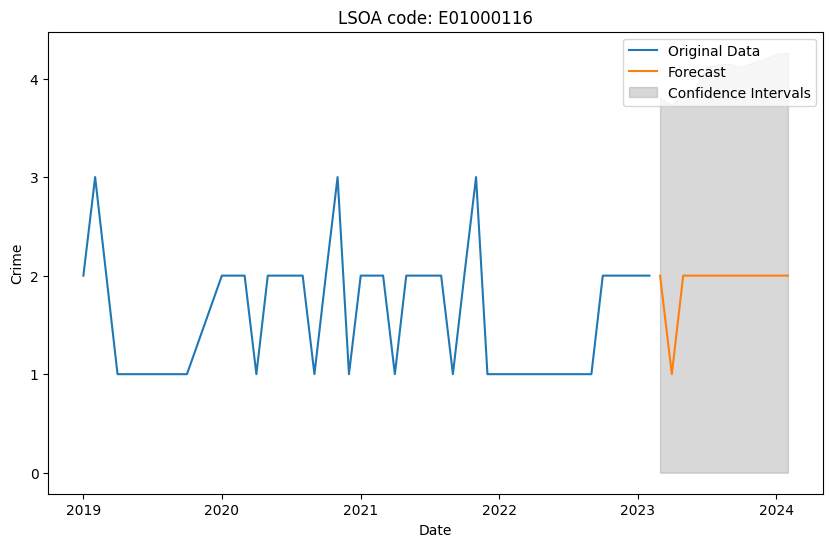

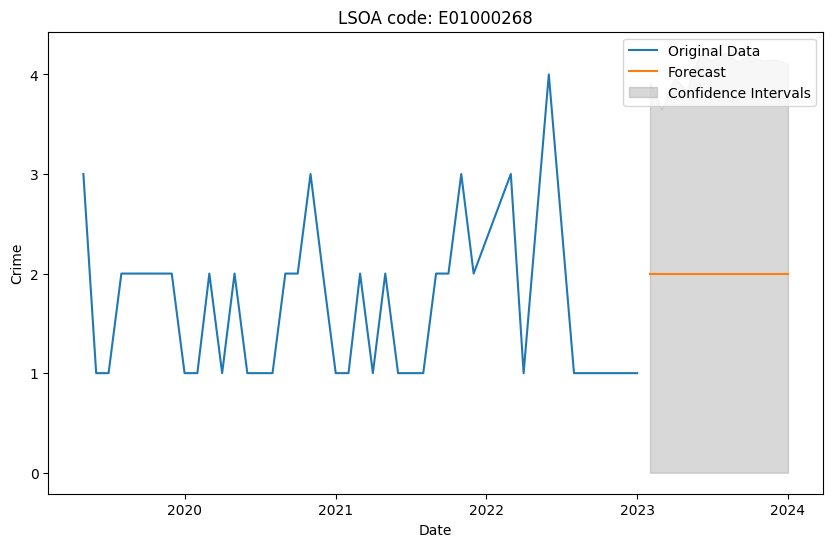

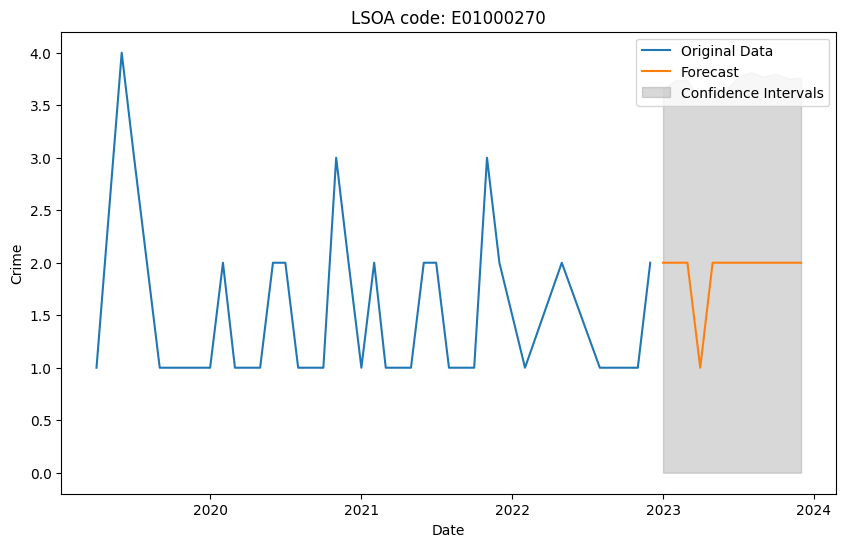

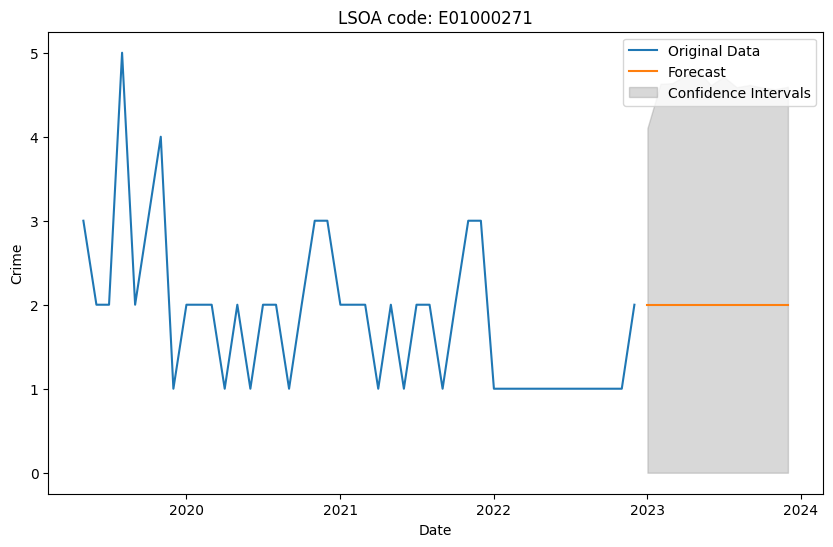

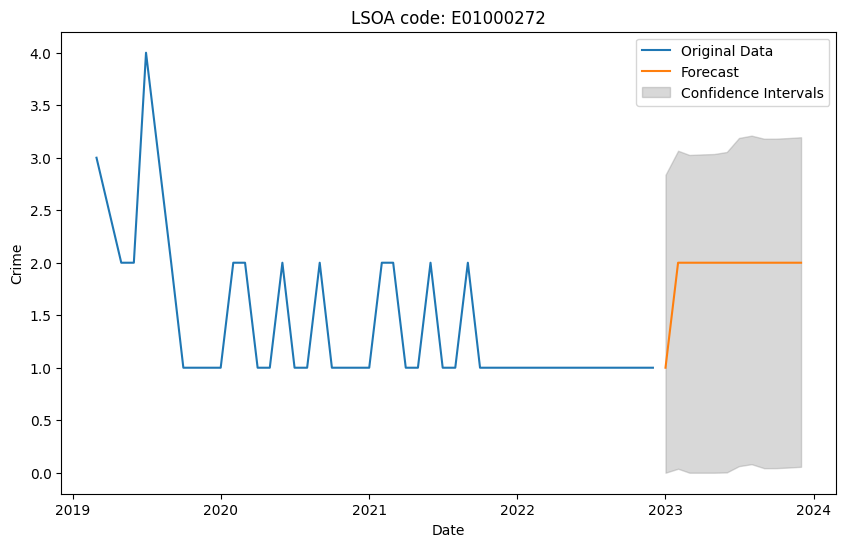

...

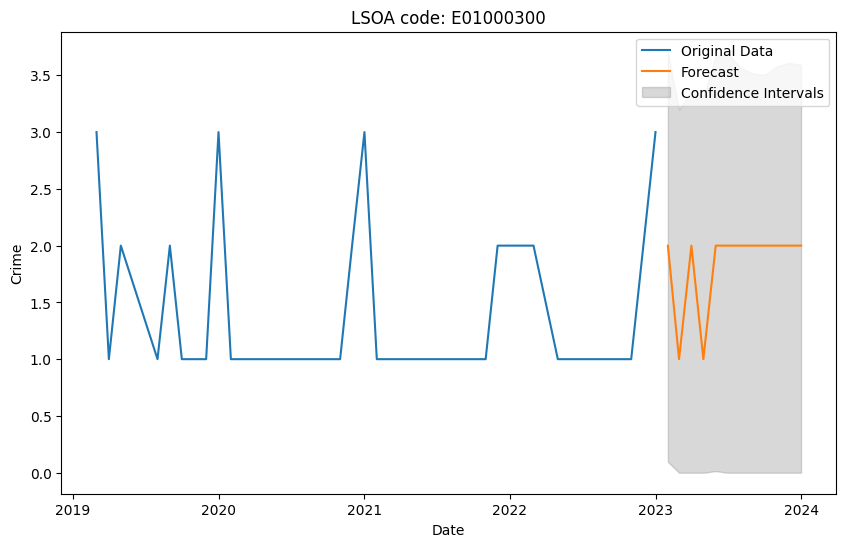

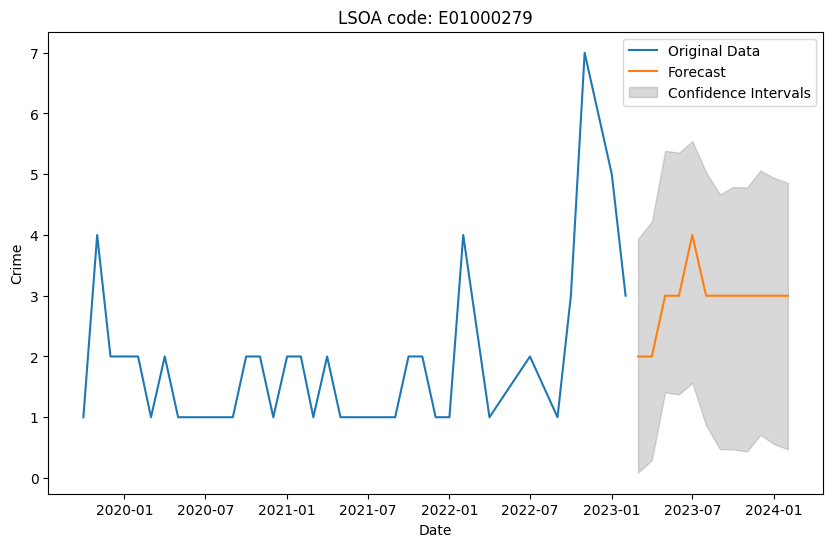

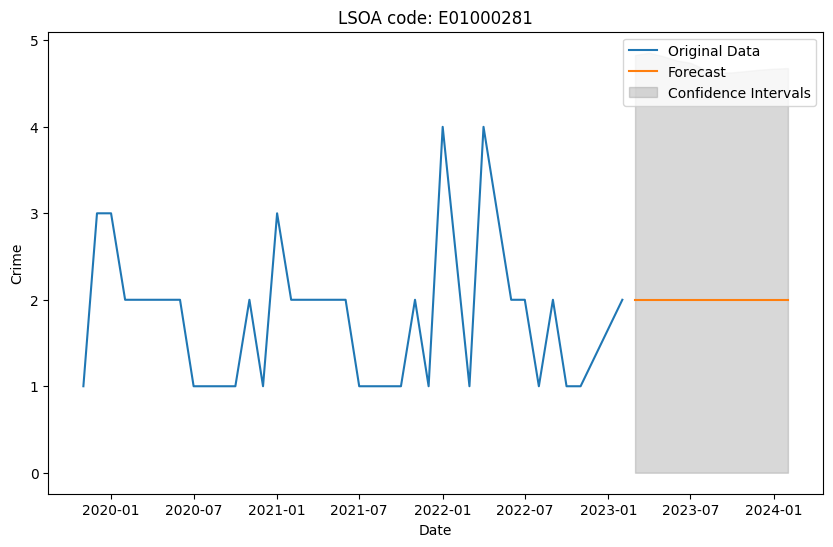

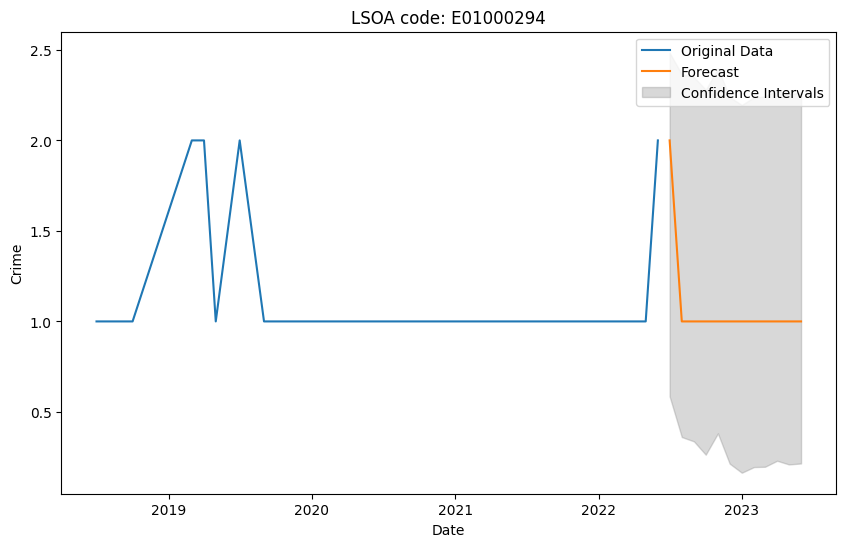

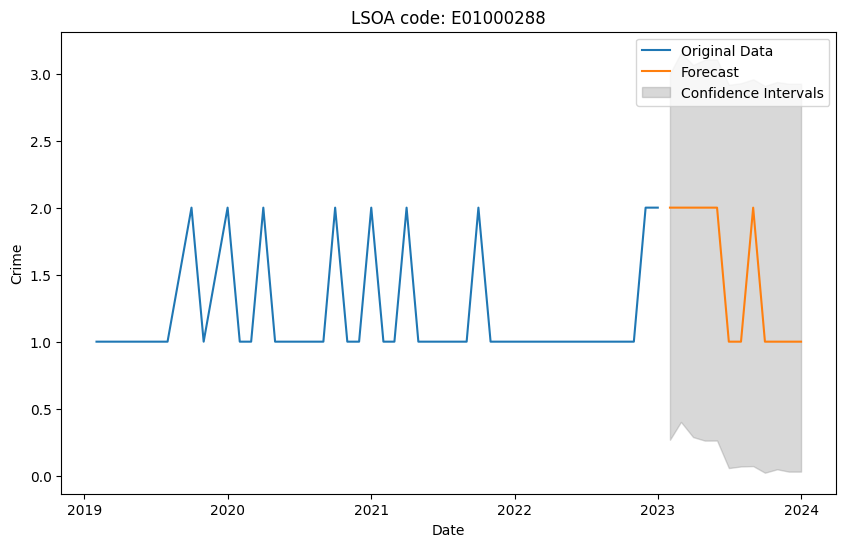

KeyboardInterrupt: ignored

In [ ]:
df_forecast = pd.DataFrame(columns=['ds', 'y', 'LSOA code'])


for code in lsoa_codes:
  current_lsoa = pd.DataFrame(columns=['ds', 'y', 'LSOA code'])

  df_lsoa = df[df['LSOA code'] == code]
  df_lsoa = df_lsoa[['y']]
  df_lsoa = df_lsoa.astype(float)  # Convert data to float

  last_index = df_lsoa.index[-1]


  lag_order = 7  # Adjust the lag order as needed
  model = AutoReg(df_lsoa, lags=lag_order)  # lag_order is determined from model selection
  model_fit = model.fit()

  num_steps = 12  # Adjust the number of future steps as needed

  forecast = model_fit.forecast(steps=num_steps)

  pred = model_fit.get_prediction(start=len(df_lsoa), end=len(df_lsoa) + num_steps - 1)
  forecast_values = pred.predicted_mean
  i = 1
  for forecast in forecast_values:
    df_forecast = df_forecast.append({'ds': last_index + relativedelta(months=i), 'y': round(forecast), 'LSOA code': code}, ignore_index=True)
    current_lsoa = current_lsoa.append({'ds': last_index + relativedelta(months=i), 'y': round(forecast), 'LSOA code': code}, ignore_index=True)
    i+=1

  confidence_intervals = pred.conf_int(alpha=0.05) # 95% confidence interval

  # crime can never be below 0 so clipping confidence intervals to reflect this
  lower_bound = confidence_intervals.iloc[:, 0].clip(lower=0)
  upper_bound = confidence_intervals.iloc[:, 1].clip(lower=0)

  # only showing last 3 years and then the 6 months forecast
  plt.figure(figsize=(10, 6))
  plt.plot(df_lsoa.index[-36:], df_lsoa['y'].values[-36:], label='Original Data')
  plt.plot(current_lsoa['ds'], current_lsoa['y'], label='Forecast')
  plt.fill_between(
      current_lsoa['ds'],
      lower_bound,
      upper_bound,
      color='gray',
      alpha=0.3,
      label='Confidence Intervals'
  )
  plt.xlabel('Date')
  plt.ylabel('Crime')
  plt.legend()
  plt.title(f'LSOA code: {code}')
  plt.show()






# Forecast Dataframe

In [ ]:
#print forecast values
df_forecast

# AutoRegression for Ward

In [ ]:
df = pd.read_csv(r"https://raw.githubusercontent.com/pdiggidy/DataChallenge2/main/DC2Data/wards_crime_covid_adjusted_filled_rnd_gaps.csv")

In [ ]:
df['ds'] = pd.to_datetime(df['ds'])  # Convert the 'Date' column to datetime
df.set_index('ds', inplace=True)  # Set 'Date' as the index

In [ ]:
lsoa_codes = df['LSOA code'].unique()

,Ward,y
ds,,
2010-12-01,Barnet Vale Ward,18
2011-01-01,Barnet Vale Ward,22
2011-02-01,Barnet Vale Ward,22
2011-03-01,Barnet Vale Ward,16
2011-04-01,Barnet Vale Ward,20
...,...,...
2022-10-01,Woodhouse Ward,13
2022-11-01,Woodhouse Ward,20
2022-12-01,Woodhouse Ward,15
